### Import thư viện và đọc ảnh

In [1]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.axes
import numpy as np
from scipy import signal
from typing import Callable, Literal
import heapq
import sys
import types
import math
import queue

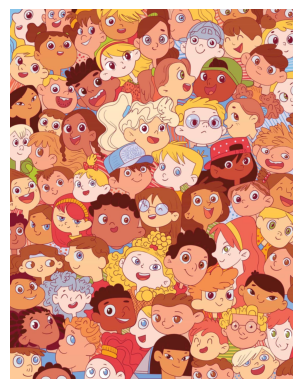

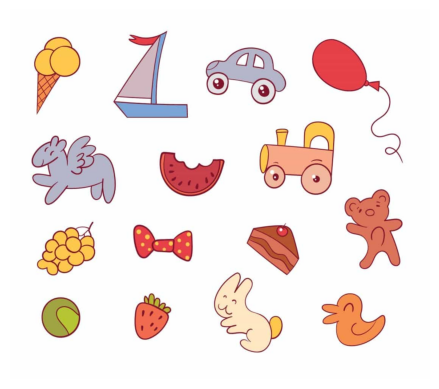

In [2]:
img = cv2.imread("1.jpg")
OBJECT_IMG = img[850:, 1450:]
TARGET_IMG = img[:, :1400]
plt.imshow(TARGET_IMG[:, :, ::-1])
plt.axis("off")
plt.show()
plt.imshow(OBJECT_IMG[:, :, ::-1])
plt.axis("off")
plt.show()

### Trích xuất đối tượng cần tìm

In [3]:
def extract_all(image: np.ndarray, area_threshold: int = 100, size: int = 1):
    if len(image.shape) == 3:
        image = image[:, :, 0]
    image = image.astype(np.uint8)
    _, thresh = cv2.threshold(image, 240, 255, cv2.THRESH_BINARY)
    thresh = 255-thresh
    traveled: set[tuple[int, int]] = set([])
    islands: dict[tuple[int, int], list[tuple[int, int]]] = {}
    q: queue.SimpleQueue[tuple[int, int]] = queue.SimpleQueue()
    image_h, image_w = image.shape
    def get_neighbor(position: tuple[int, int]) -> list[tuple[int, int]]:
        result = []
        for j in range(-size, size+1):
            for i in range(-size, size+1):
                if not (i == 0 and j == 0):
                    offset = (j, i)
                    new_position = (position[0]+offset[0], position[1]+offset[1])
                    if 0 <= new_position[0] and new_position[0] < image_h and 0 <= new_position[1] and new_position[1] < image_w:
                        result.append(new_position)
        return result
    target_pixels = np.column_stack(np.where(thresh == 255))
    target_pixels = set((pos[0], pos[1]) for pos in target_pixels)
    for current_position in target_pixels:
        if current_position not in traveled:
            root = current_position
            traveled.add(root)
            q.put(root)
            islands[root] = [root]
            while not q.empty():
                current_position = q.get()
                neighbors = get_neighbor(current_position)
                for neigbor in neighbors:
                    if neigbor not in traveled and neigbor in target_pixels:
                        traveled.add(neigbor)
                        islands[root].append(neigbor)
                        q.put(neigbor)
    real_islands: dict[tuple[int, int], list[tuple[int, int]]] = {}
    for root, pixels in islands.items():
        if len(pixels) > area_threshold:
            real_islands[root] = (pixels)
    print(f"Detected {len(real_islands)} objects in total of {len(islands)} clusters")
    return real_islands
def extract_object(image: np.ndarray, island: list[tuple]) -> np.ndarray:
    min_y, max_y, min_x, max_x = image.shape[0], 0, image.shape[1], 0
    for position in island:
        min_y = min(min_y, position[0])
        max_y = max(max_y, position[0])
        min_x = min(min_x, position[1])
        max_x = max(max_x, position[1])
    # print(island)
    width = max_x - min_x
    height = max_y - min_y
    result = np.zeros((height+1, width+1, image.shape[2]), np.uint8)
    # print(result.shape, image.shape)
    for position in island:
        result[position[0]-min_y, position[1]-min_x] = image[position]
    return result   

In [4]:
islands = extract_all(OBJECT_IMG, 100, 3)

Detected 15 objects in total of 74 clusters


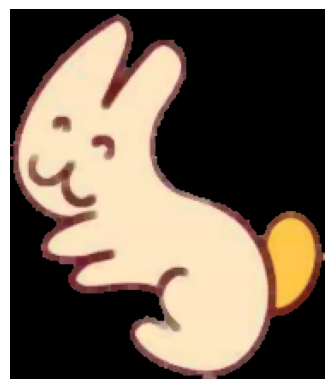

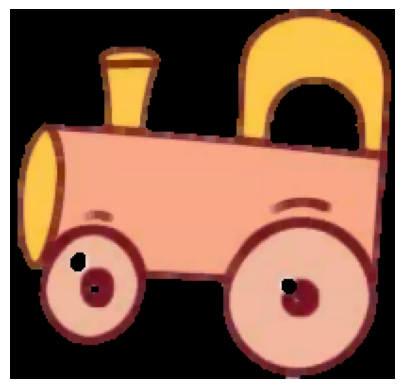

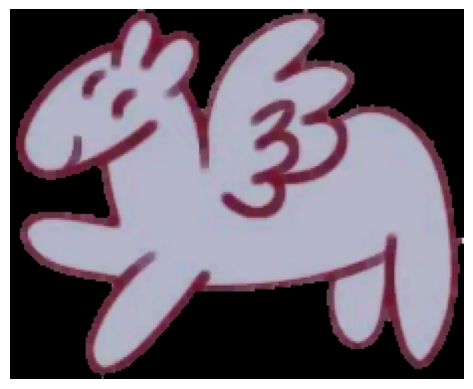

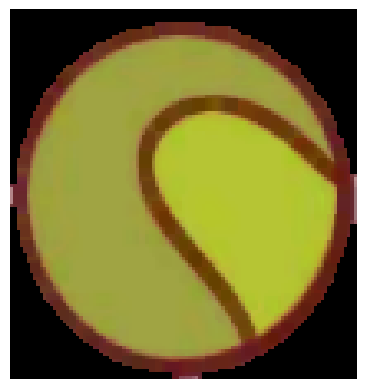

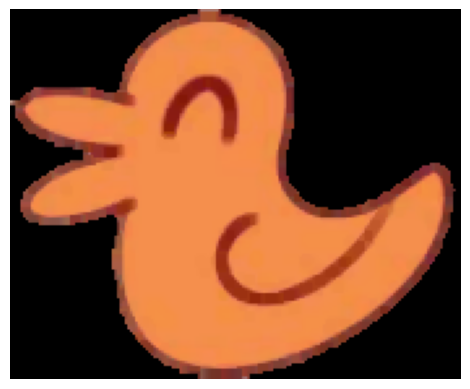

...

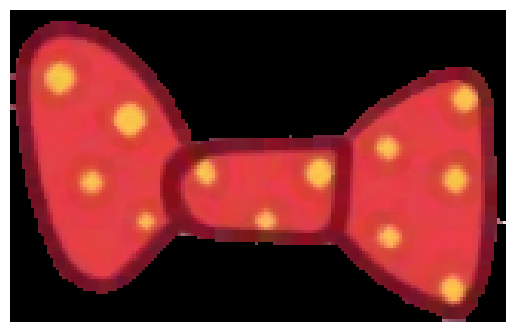

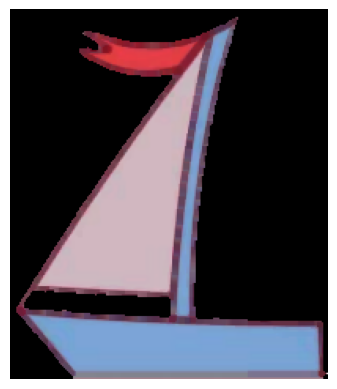

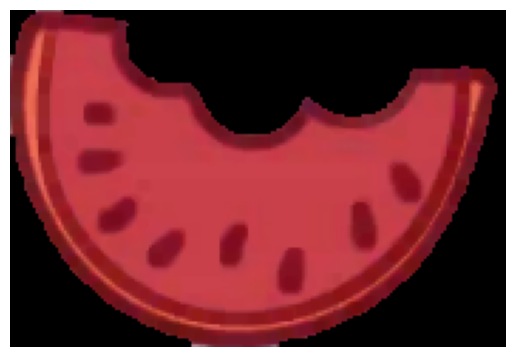

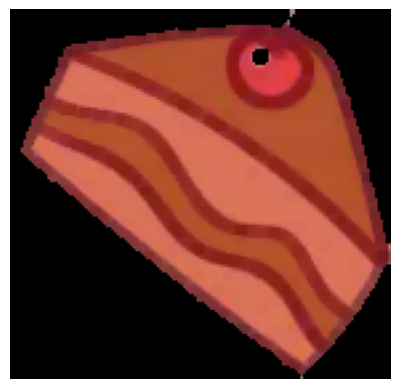

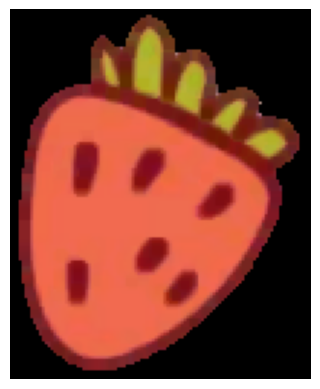

In [5]:
OBJECT_IMGS: list[np.ndarray] = []
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
for island in islands.values():
    object_image = extract_object(OBJECT_IMG, island)
    blur = cv2.medianBlur(object_image, 3)
    eroded = cv2.erode(blur, kernel)
    OBJECT_IMGS.append(eroded)
    plt.imshow(eroded[:, :, ::-1])
    plt.axis("off")
    plt.show(True)

### Nhận dạng và tìm kiếm đối tượng

#### Hàm trích xuất kết quả

In [6]:
def draw_bound(img: np.ndarray, top: int, down: int, left: int, right: int, size: int, color: int | np.ndarray):
    img[top:down, left-size//2:left+size//2] = color
    img[top:down, right-size//2:right+size//2] = color
    img[top-size//2:top+size//2, left:right] = color
    img[down-size//2:down+size//2, left:right] = color
    return img
def detect_area(mask: np.ndarray, region_size: tuple[int, int], region_pad: tuple[int, int] = (0, 0), num_result: int = 1, is_min: bool = True):
    local_mask = mask.copy()
    if not is_min:
        local_mask *= -1
    detected_mask = np.zeros_like(mask).astype(bool)
    detected_mask[:, :] = False
    pq = []
    mask_h, mask_w = mask.shape[:2]    
    for y in range(mask_h):
        for x in range(mask_w):
            heapq.heappush(pq, (local_mask[y, x], (y, x)))
    result = []
    while len(pq) > 0 and len(result) < num_result:
        _, (y, x) = heapq.heappop(pq)
        if detected_mask[y, x]: continue
        # print(_, y , x)
        detected_mask[max(0, y-region_pad[0]): min(mask_h-1, y+region_size[0]+region_pad[0]), max(0, x-region_pad[1]): min(mask_w-1, x+region_size[1]+region_pad[1])] = True
        result.append((y, x))
    return result

#### Các hàm phương pháp sử dụng

In [7]:
def compute_template_matching_cv2(img: np.ndarray, template: np.ndarray, mask: np.ndarray):
    n_template = template.astype(np.uint8)
    n_img = img.astype(np.uint8)
    if np.std(n_template) == 0:
        raise ValueError("Std = 0")
    if np.std(n_img) == 0:
        raise ValueError("Std = 0")
    result = cv2.matchTemplate(n_img, n_template, cv2.TM_CCOEFF_NORMED, mask=mask)
    result = np.where(np.isinf(result), 0, result)
    return result
def process_single_object(img: np.ndarray, template: np.ndarray, mask: np.ndarray):
    result = compute_template_matching_cv2(img, template, mask)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    top_left = max_loc
    bound_image = draw_bound(img, top_left[1], top_left[1] + template.shape[0], top_left[0], top_left[0] + template.shape[1], 8, (0, 0, 255))
    return max_val, result, bound_image, (top_left[1], top_left[0])
def compute_template_matching_cv2_no_mask(img: np.ndarray, template: np.ndarray):
    n_template = template.astype(np.uint8)
    n_img = img.astype(np.uint8)
    if np.std(n_template) == 0:
        raise ValueError("Std = 0")
    if np.std(n_img) == 0:
        raise ValueError("Std = 0")
    result = cv2.matchTemplate(n_img, n_template, cv2.TM_CCOEFF_NORMED)
    result = np.where(np.isinf(result), 0, result)
    return result
def process_single_object_no_mask(img: np.ndarray, template: np.ndarray):
    result = compute_template_matching_cv2_no_mask(img, template)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    top_left = max_loc
    bound_image = draw_bound(img, top_left[1], top_left[1] + template.shape[0], top_left[0], top_left[0] + template.shape[1], 8, (0, 0, 255))
    return max_val, result, bound_image, (top_left[1], top_left[0])

#### Template matching

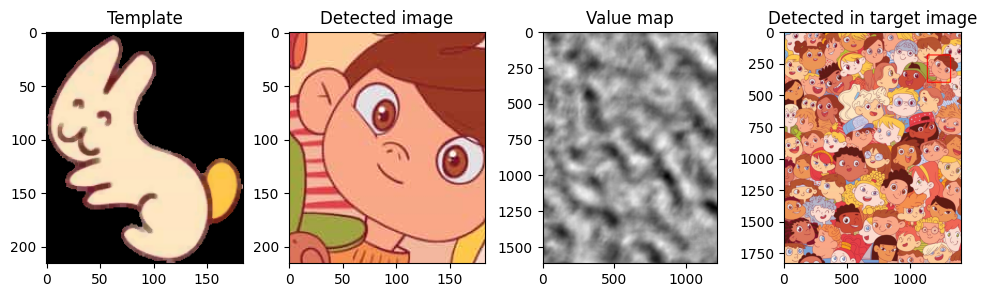

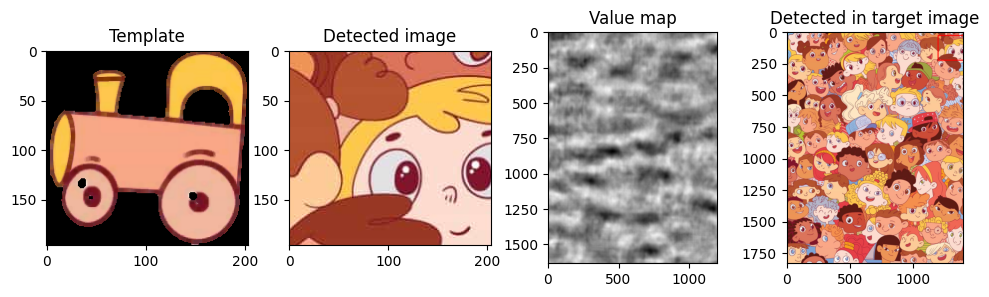

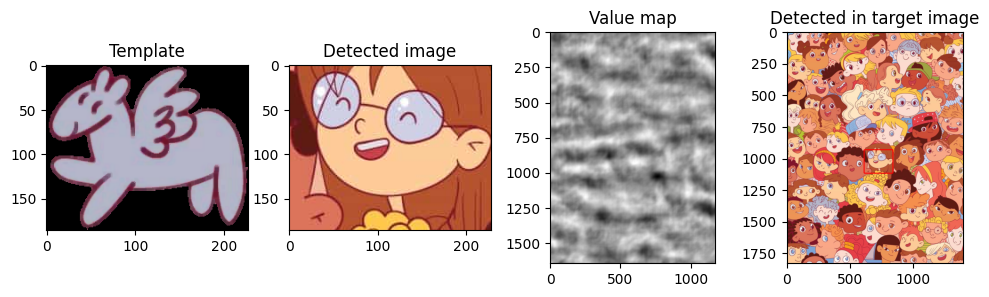

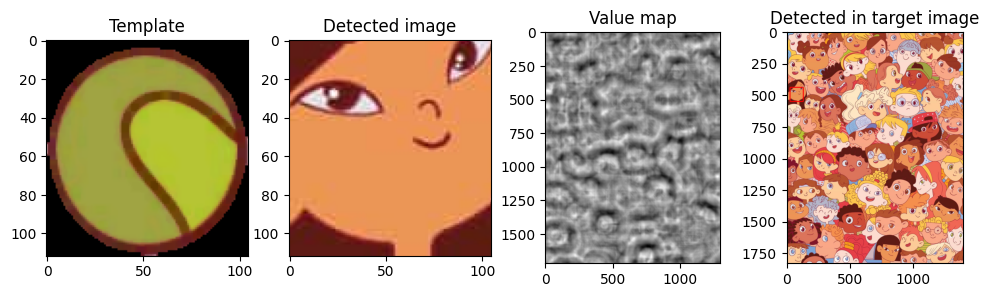

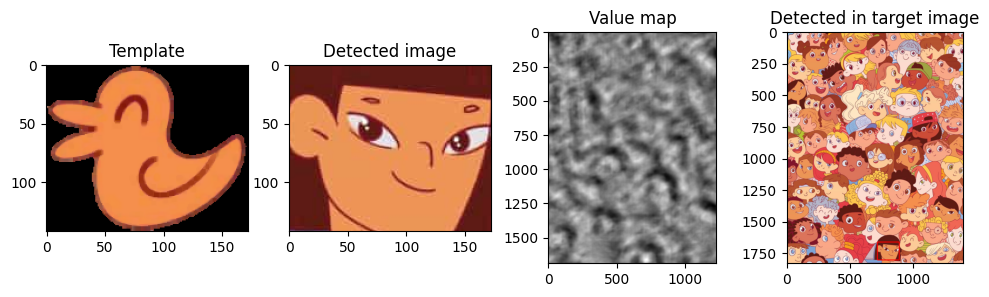

...

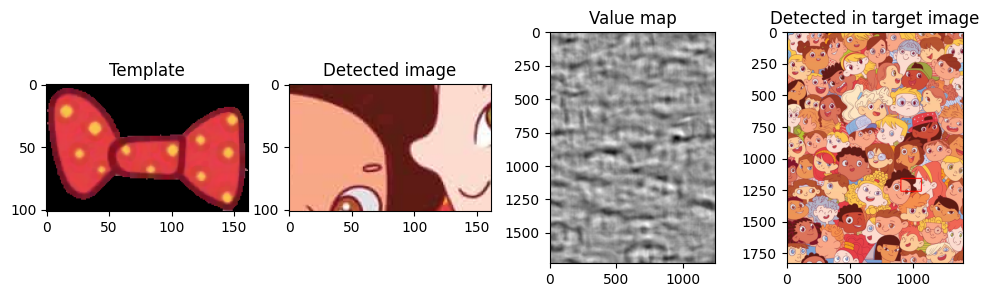

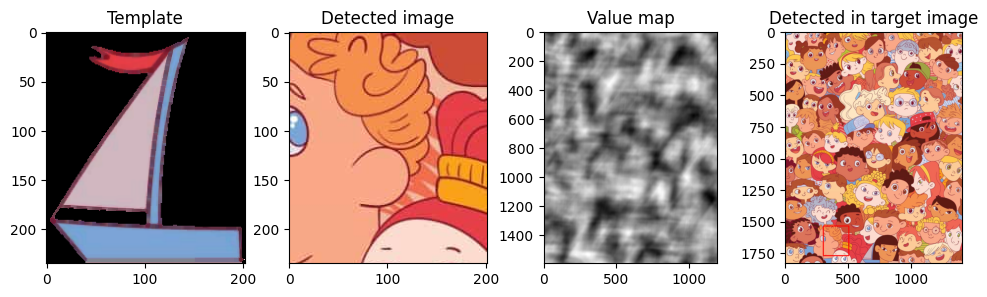

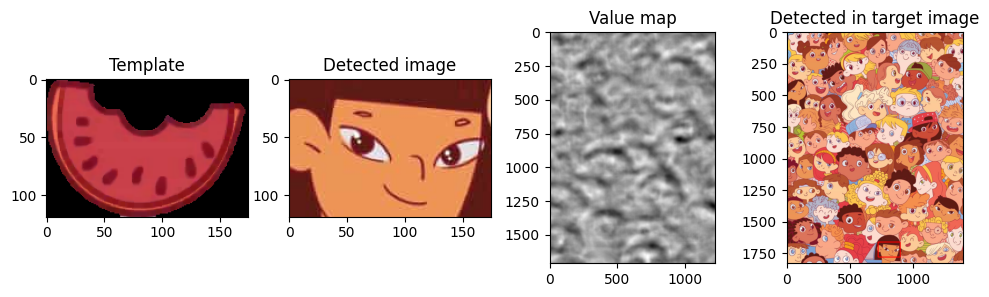

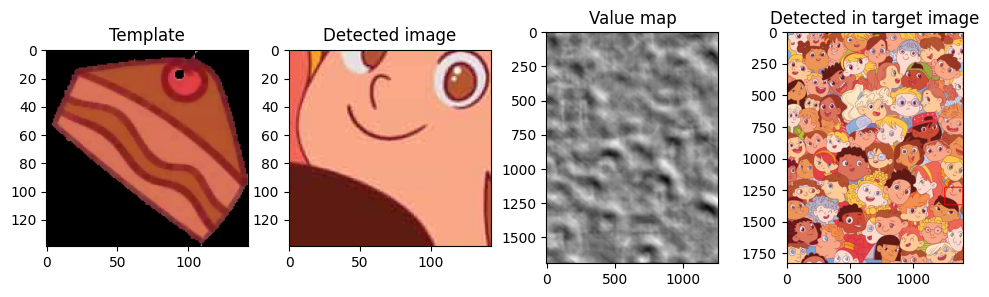

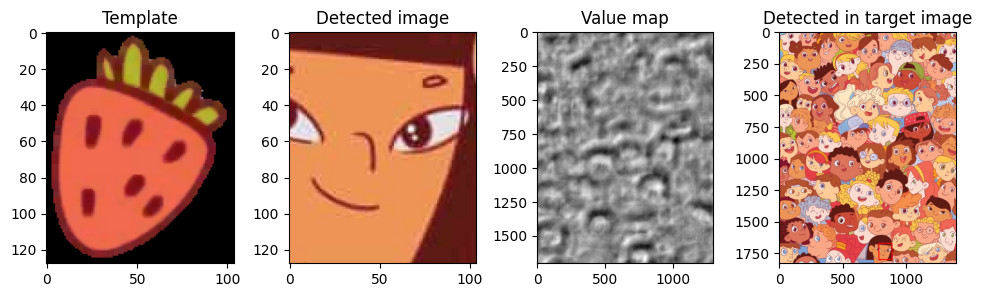

In [8]:
for template in OBJECT_IMGS:
    local_max, result, bound_image, pos = process_single_object_no_mask(TARGET_IMG.copy(), template.copy().astype(np.uint8))
    _, axes = plt.subplots(1, 4, figsize=(12, 3))
    axes: list[matplotlib.axes.Axes]
    axes[0].imshow(template[:, :, ::-1])
    axes[0].set_title("Template")
    axes[1].imshow(TARGET_IMG[pos[0]:pos[0]+template.shape[0], pos[1]:pos[1]+template.shape[1]][:, :, ::-1])
    axes[1].set_title("Detected image")
    axes[2].imshow(result, cmap="gray")
    axes[2].set_title("Value map")
    axes[3].imshow(bound_image[:, :, ::-1])
    axes[3].set_title("Detected in target image")
    plt.show(True)


#### Template matching với resize

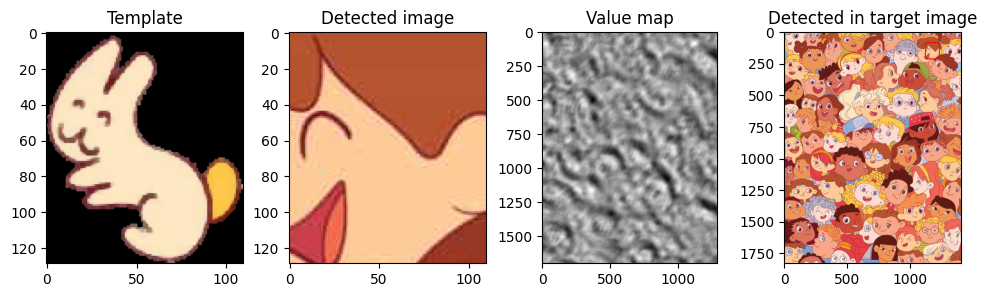

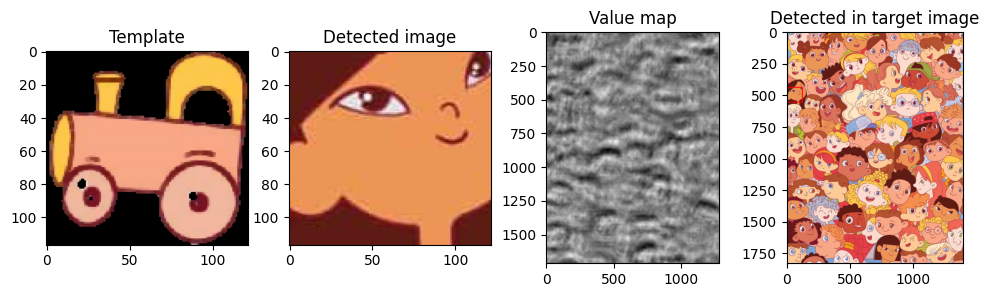

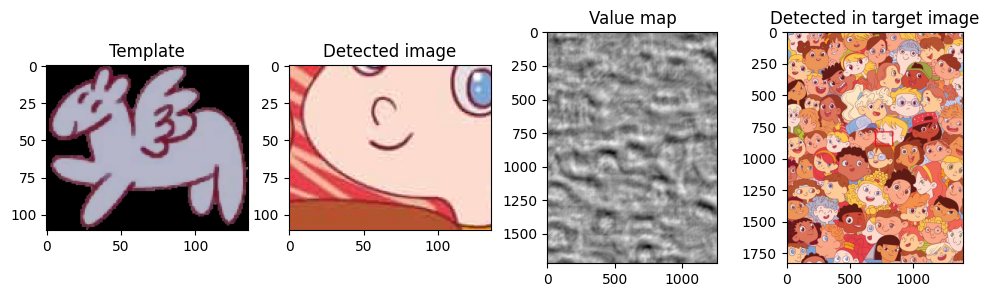

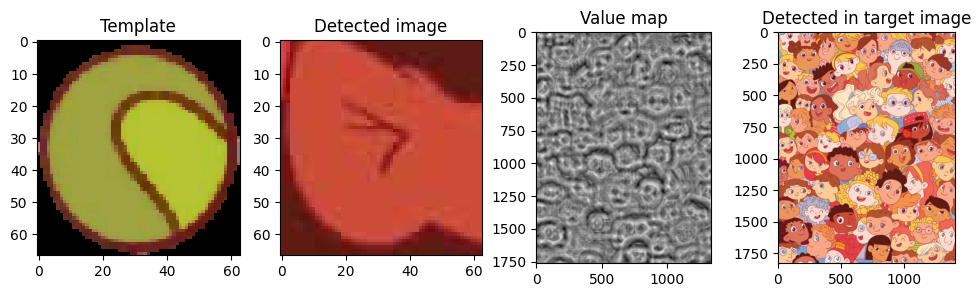

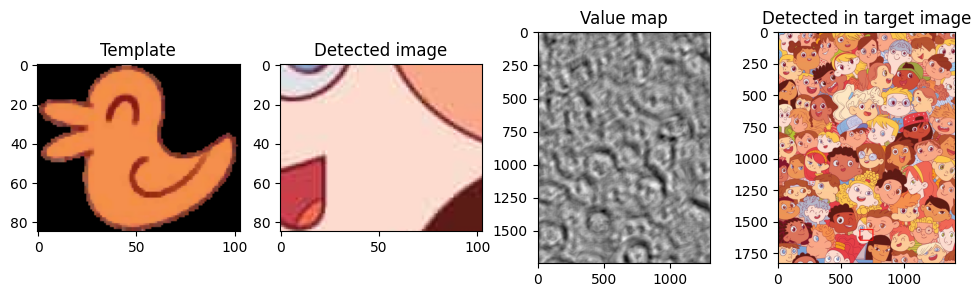

...

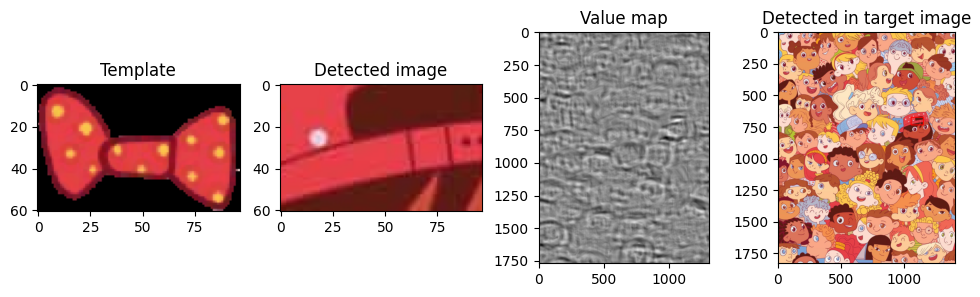

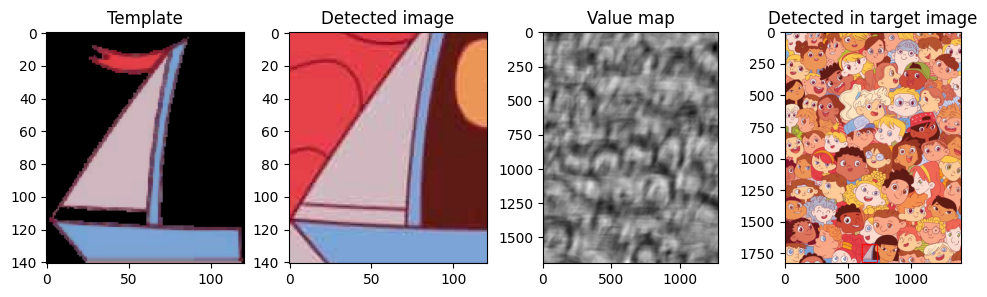

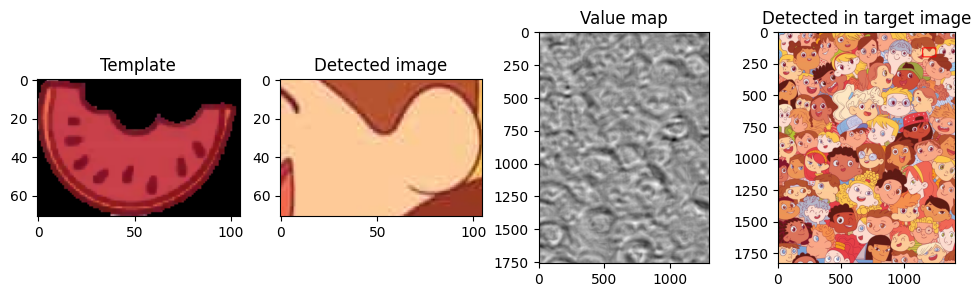

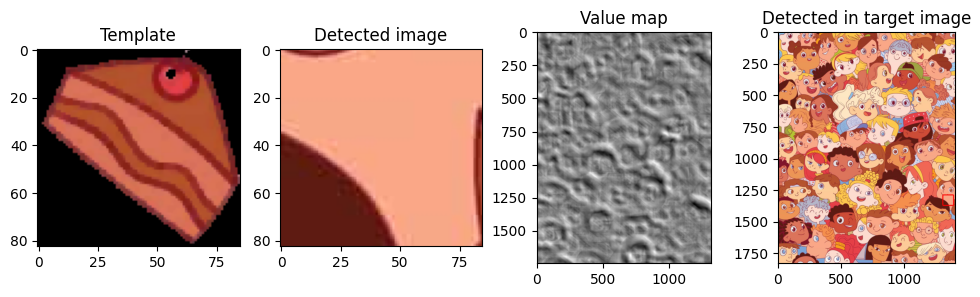

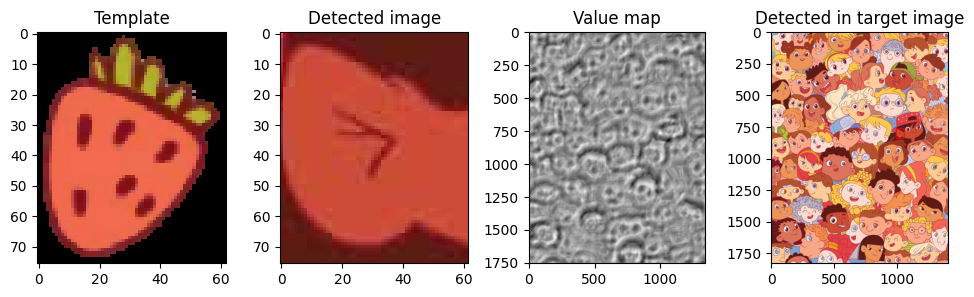

In [9]:
scale = 0.6
for template in OBJECT_IMGS:
    resized_template = template.copy().astype(np.uint8) # resized template
    resized_template = cv2.resize(resized_template, (int(template.shape[1]*scale), int(template.shape[0]*scale)), interpolation=cv2.INTER_NEAREST_EXACT) 
    local_max, result, bound_image, pos = process_single_object_no_mask(TARGET_IMG.copy(), resized_template)
    _, axes = plt.subplots(1, 4, figsize=(12, 3))
    axes: list[matplotlib.axes.Axes]
    axes[0].imshow(resized_template[:, :, ::-1])
    axes[0].set_title("Template")
    axes[1].imshow(TARGET_IMG[pos[0]:pos[0]+resized_template.shape[0], pos[1]:pos[1]+resized_template.shape[1]][:, :, ::-1])
    axes[1].set_title("Detected image")
    axes[2].imshow(result, cmap="gray")
    axes[2].set_title("Value map")
    axes[3].imshow(bound_image[:, :, ::-1])
    axes[3].set_title("Detected in target image")
    plt.show(True)


#### Template matching với mask

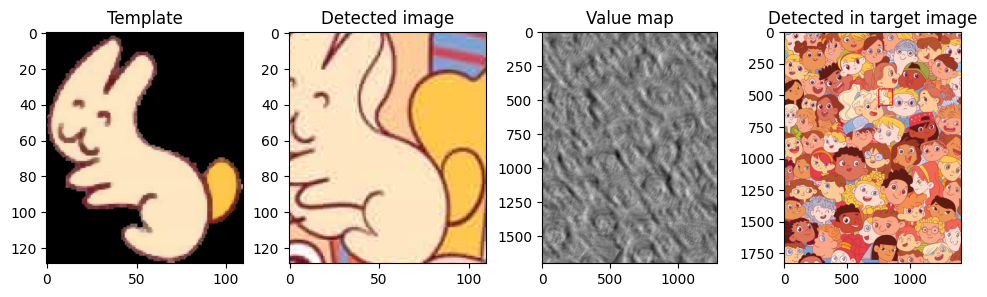

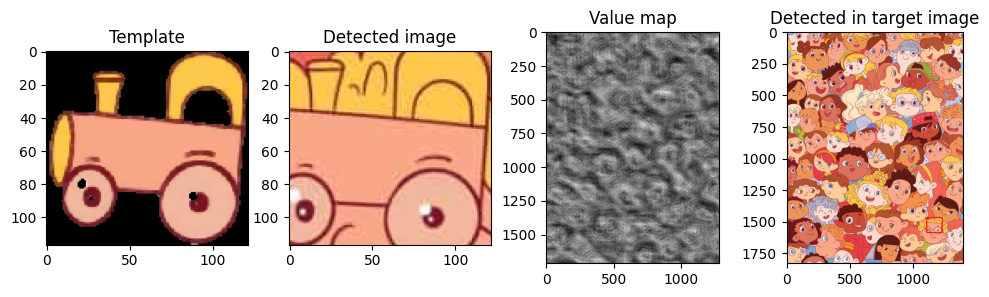

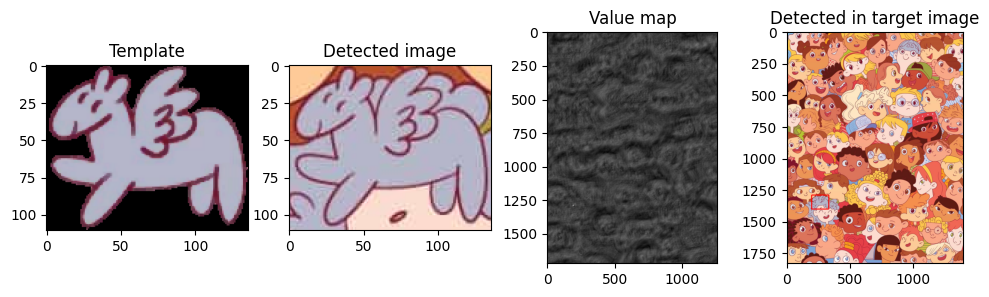

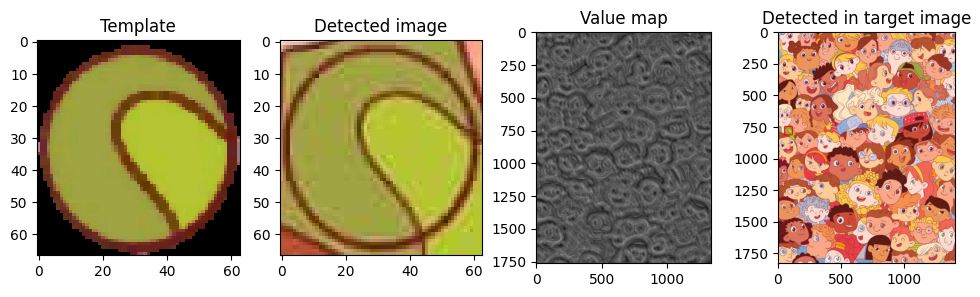

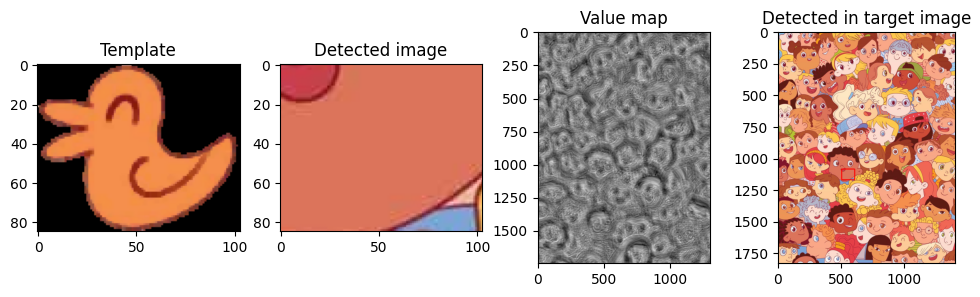

...

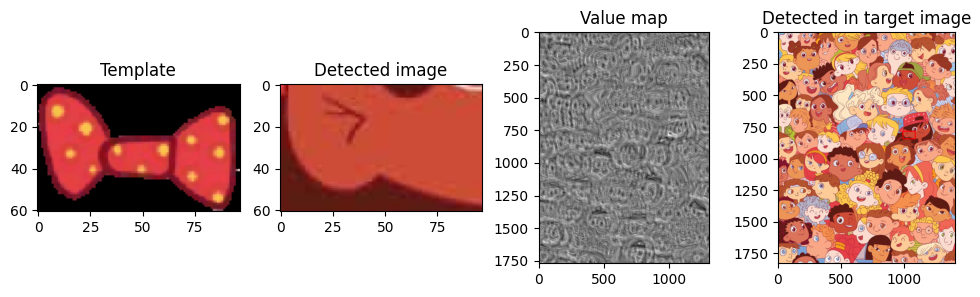

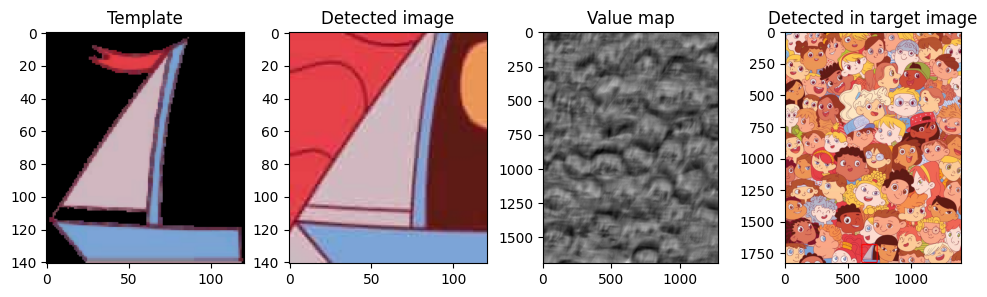

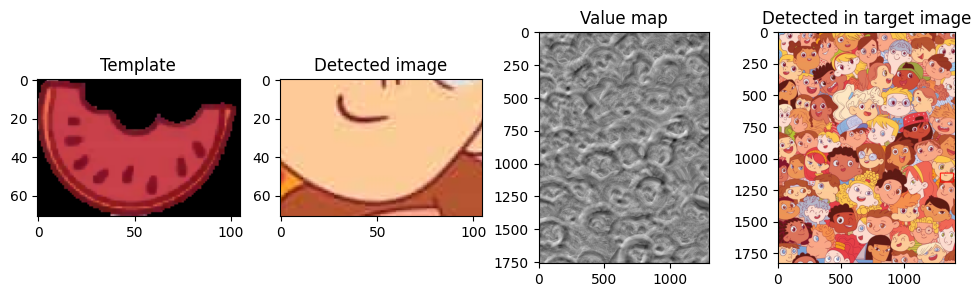

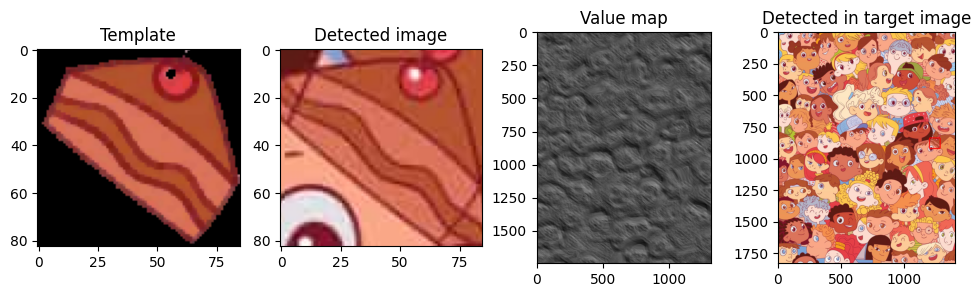

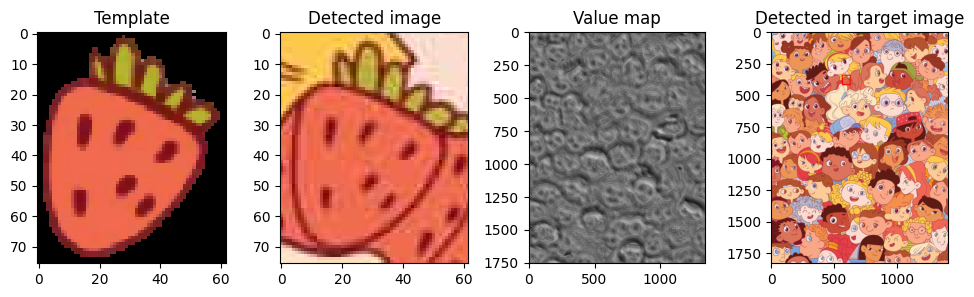

In [10]:
scale = 0.6
for template in OBJECT_IMGS:
    resized_template = template.copy().astype(np.uint8) # resized template
    _, mask = cv2.threshold(template, 1, 255, cv2.THRESH_BINARY)      
    mask = cv2.resize(mask, (int(mask.shape[1]*scale), int(mask.shape[0]*scale)), interpolation=cv2.INTER_NEAREST_EXACT)
    resized_template = cv2.resize(resized_template, (mask.shape[1], mask.shape[0]), interpolation=cv2.INTER_NEAREST_EXACT) 
    local_max, result, bound_image, pos = process_single_object(TARGET_IMG.copy(), resized_template, mask.astype(np.uint8))
    _, axes = plt.subplots(1, 4, figsize=(12, 3))
    axes: list[matplotlib.axes.Axes]
    axes[0].imshow(resized_template[:, :, ::-1])
    axes[0].set_title("Template")
    axes[1].imshow(TARGET_IMG[pos[0]:pos[0]+resized_template.shape[0], pos[1]:pos[1]+resized_template.shape[1]][:, :, ::-1])
    axes[1].set_title("Detected image")
    axes[2].imshow(result, cmap="gray")
    axes[2].set_title("Value map")
    axes[3].imshow(bound_image[:, :, ::-1])
    axes[3].set_title("Detected in target image")
    plt.show(True)


#### Template matching với mask và điều chỉnh scale

start
Final  0.7156471610069275


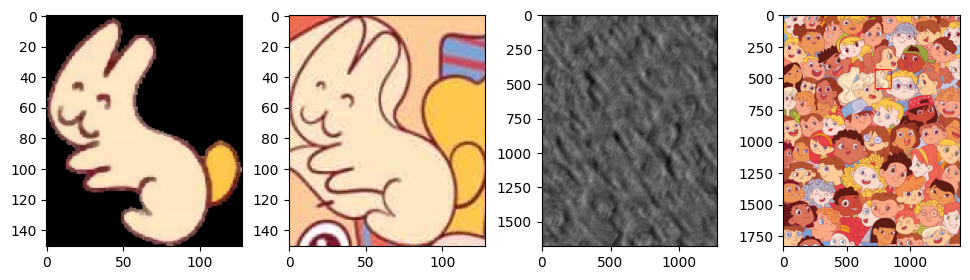

start
Final  0.7799746990203857


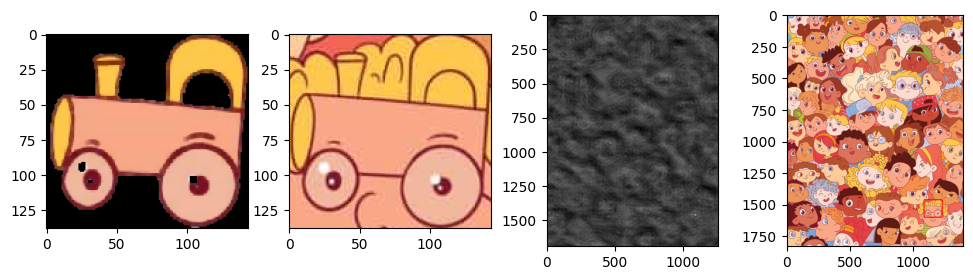

start
Final  0.7705046534538269


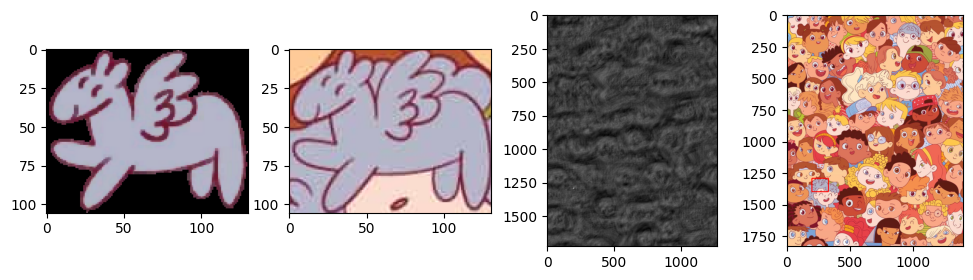

start
Final  0.705830991268158


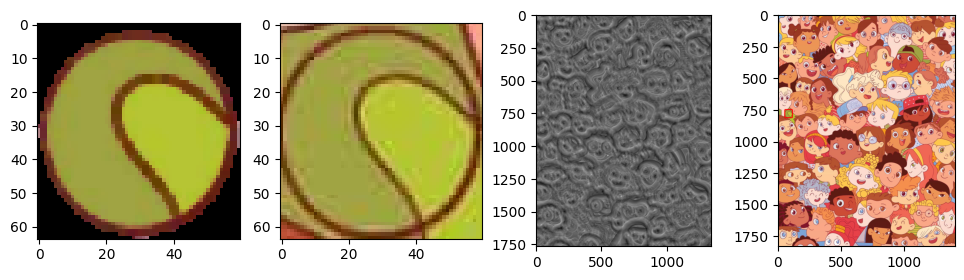

start
Final  0.7371351718902588


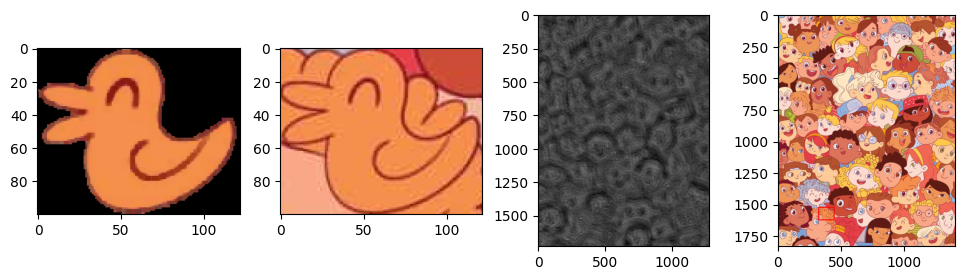

start
Final  0.7173615097999573


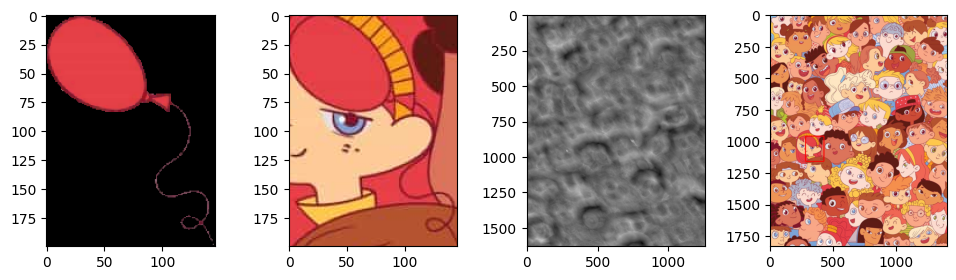

start
Final  0.747689962387085


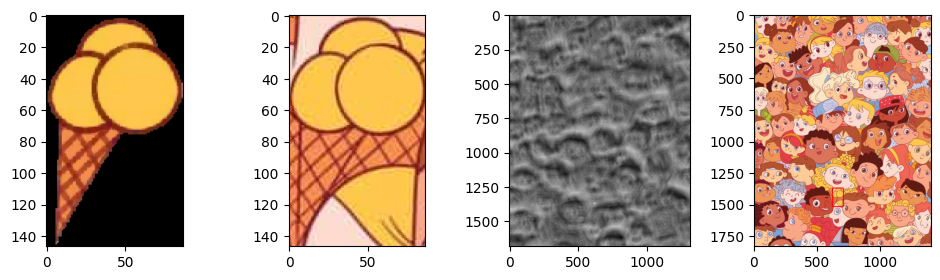

start
Final  0.7170498967170715


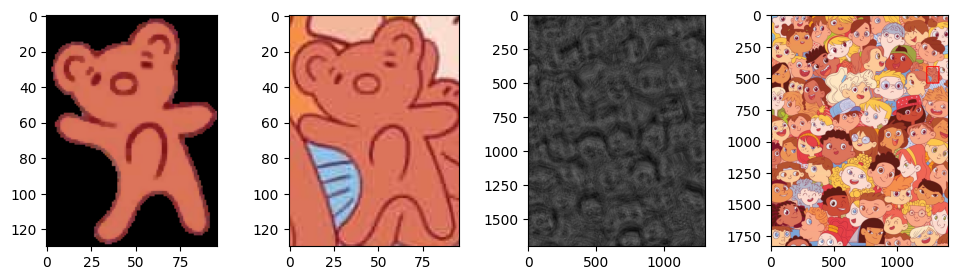

start
Final  0.7827834486961365


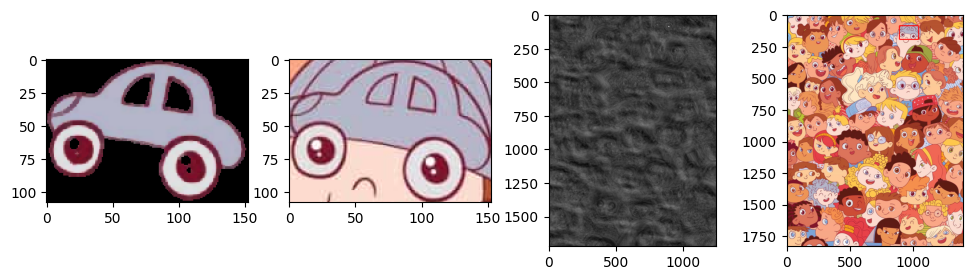

start
Final  0.7075087428092957


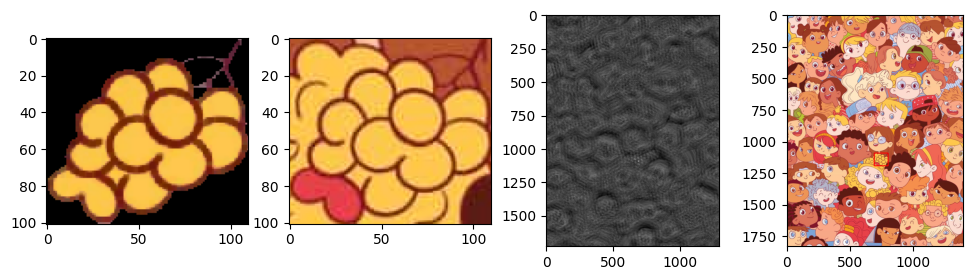

start
Final  0.7281028628349304


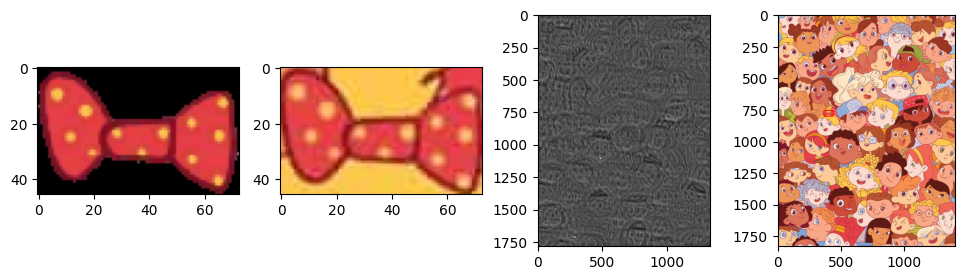

start
Final  0.7001100182533264


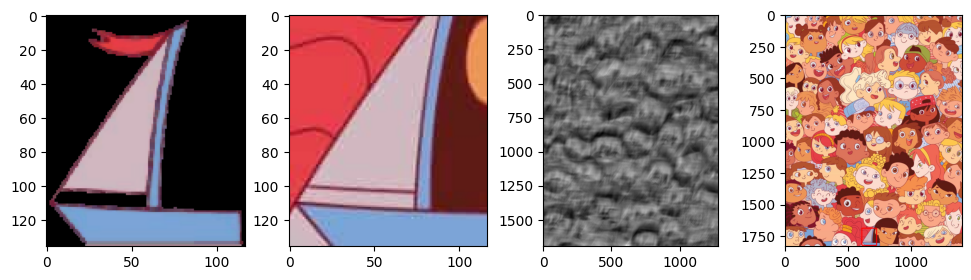

start
Final  0.7188535332679749


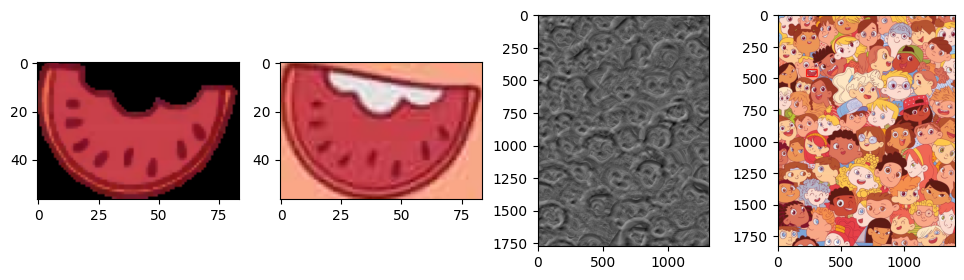

start
Final  0.7207317352294922


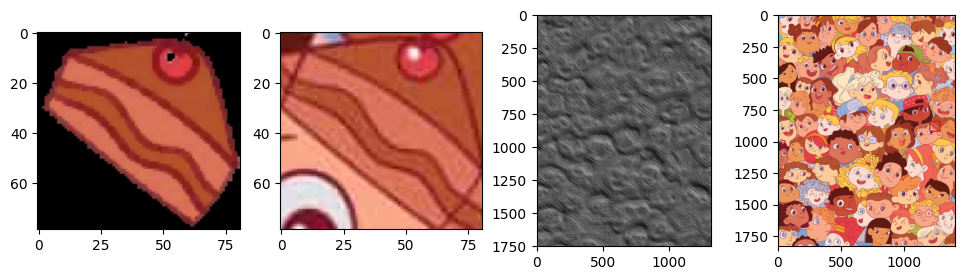

start
Final  0.7707845568656921


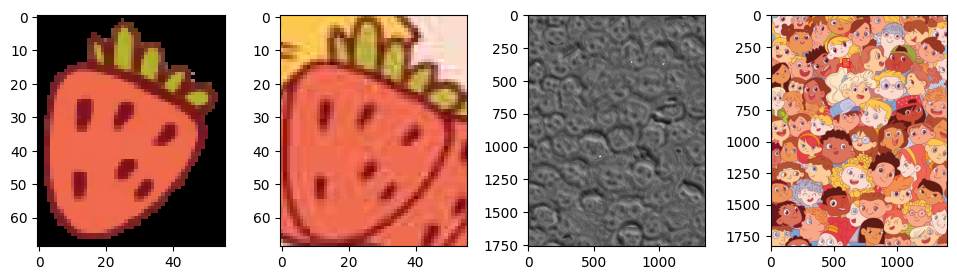

In [11]:
target = 0.7
detected_boxes: list = []
for template in OBJECT_IMGS:
    print("start")
    max_val = 0
    max_result = None
    max_bound_image = None
    max_template = None
    max_detected = None
    max_box = None
    for scale in range(40, 160):
        scale /= 160
        resized_template = template.copy().astype(np.uint8)
        _, mask = cv2.threshold(template, 1, 255, cv2.THRESH_BINARY)       
        mask = cv2.resize(mask, (int(mask.shape[1]*scale), int(mask.shape[0]*scale)), interpolation=cv2.INTER_NEAREST_EXACT)
        resized_template = cv2.resize(resized_template, (mask.shape[1], mask.shape[0]), interpolation=cv2.INTER_NEAREST_EXACT)
        local_max, result, bound_image, pos = process_single_object(TARGET_IMG.copy(), resized_template, mask.astype(np.uint8))
        if local_max > max_val:
            max_val = local_max
            max_result = result.copy()
            max_bound_image = bound_image.copy()
            max_template = np.zeros_like(resized_template)
            max_template[mask.astype(bool)] = resized_template[mask.astype(bool)]
            max_detected = TARGET_IMG[pos[0]:pos[0]+max_template.shape[0], pos[1]:pos[1]+max_template.shape[1]]
            max_box = [pos[0],pos[0]+max_template.shape[0], pos[1], pos[1]+max_template.shape[1]]
        # print(local_max, scale)
        if max_val >= target: break
    _, axes = plt.subplots(1, 4, figsize=(12, 3))
    axes: list[matplotlib.axes.Axes]
    print("Final ", max_val)
    axes[0].imshow(max_template[:, :, ::-1])
    axes[1].imshow(max_detected[:, :, ::-1])
    axes[2].imshow(max_result, cmap="gray")
    axes[3].imshow(max_bound_image[:, :, ::-1])
    detected_boxes.append(max_box)
    plt.show(True)


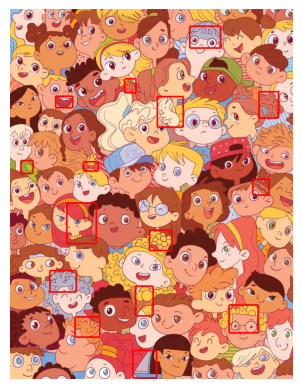

In [12]:
final_image = TARGET_IMG.copy()
for box in detected_boxes:
    final_image = draw_bound(final_image, box[0], box[1], box[2], box[3], 8, (0, 0, 255))
plt.imshow(final_image[:, :, ::-1])
plt.axis("off")
plt.show()
    